# Segmentación de video
Posgrado en Ciencia e Ingeniería de la Computación - UNAM

Gibran Zazueta


Se utiliza el algoritmo de k-medios para segmentar de dos secuencias de video.

Las segmentaciones son de:

- La pupila de un ojo
- Un auto en una toma en movimiento

In [1]:
import cv2
from sklearn.cluster import KMeans
from scipy.spatial import ConvexHull
import numpy as np
import matplotlib.pyplot as plt

Se define la función de segmentación por **k-medios**
Recibe imagen de entrada y valor booleano que indica si se está segmentado la pupila o el auto (*True*=pupila, *False*=auto)

La diferencia es el *cluster* que busca el algoritmo.

- En el caso de la pupila toma en cuenta los colores más cercanos a 0 (negro)
- En el caso del auto toma en cuenta los colores cercanos al rojo

In [2]:
def k_medios(imageI, red_seg=False):
    height, width, channels = imageI.shape
    
    image = cv2.GaussianBlur(imageI, (9,9), 0)
    imageR = image.reshape((image.shape[0] * image.shape[1], 3))

    zdata = np.zeros(len(imageR))
    xdata = np.zeros(len(imageR))
    ydata= np.zeros(len(imageR))
    data = np.zeros((len(imageR), 3))
    for i in range(len(imageR)):
        zdata[i] = imageR[i][2]
        xdata[i] = imageR[i,0]
        ydata[i] = imageR[i,1]
        ct = imageR[i][0]
        data[i][0] = imageR[i,0]
        data[i][1] = imageR[i,1]
        data[i][2] = imageR[i,2]

    #K-medios
    clt = KMeans(n_clusters = 9, max_iter = 300)
    k = clt.fit(data)

    #centroides
    centroides =clt.cluster_centers_
    
    #centroide minimo
    colorMin = np.array([255, 255, 255])
    colorMax = np.array([0, 0, 0])
 
    if red_seg:
        colorMax =centroides[(-centroides[:, 2]).argsort()]
        colorMax= colorMax[np.argmin(colorMax[0:2, 0]), :]
        color=colorMax
    else:
        for c in centroides:
            if np.average(c) < np.average(colorMin):
                    colorMin = c
        color = colorMin[0:3]  #Pupila
    
    print('color=', color)

    #Tomar valores 
    mask = cv2.inRange(image, np.zeros((1,3)), color)

    #Dilatación y erosión
    kernel = np.ones((6,6), np.uint8)
    mask1 = cv2.dilate(mask, kernel, iterations=1)
    kernel = np.ones((6,6), np.uint8)
    mask1 = cv2.erode(mask, kernel, iterations=2)

    #Contorno
    cont, _ = cv2.findContours(mask1, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    contours = np.concatenate(cont, axis=0)
    
    #ConvexHull

    #opencv
    hull_opencv= cv2.convexHull(contours)
    
    #scikit
    contours2 = np.zeros(shape=(len(contours),2))
    for j in range(len(contours2)):
                   contours2[j] = contours[j]
    
    hull = ConvexHull(contours2)
    hullPoints = hull.points

    #Centro
    cx = np.mean(hull.points[hull.vertices,0])
    cy = np.mean(hull.points[hull.vertices,1])
    print('cx= ', cx)
    print('cy= ', cy)
    centro = np.array([cx,cy],dtype=np.int32)
    
    #Dibujar envolvente
    #image= cv2.drawContours(image, [hullPoints.astype(int)], -1, [0,0,255], 3)
    imageI= cv2.drawContours(imageI, [hull_opencv], -1, [0,0,255], 3)  
    #Dibujar centro
    imageI = cv2.circle(imageI, (int(cx),int(cy)), radius=0, color=(200, 200, 0), thickness=3)
    #Dibujar bounding box en auto
    if red_seg:
        x,y,w,h = cv2.boundingRect(contours)
        cv2.rectangle(imageI,(x,y),(x+w,y+h),(255,0,0),3)
    #Dibujar puntos de contorno
    for i in cont:
            cv2.drawContours(imageI, i, -1, (0,200,200), 2)

    return mask1, imageI, centro





### Procesamiento del video del Ojo

Para encontrar el centro se calculó el cierre convexo de los puntos seleccionados como contorno

En los resultados se puede ver:

- Puntos del contorno en **amarillo**
- Cierre convexo en **rojo**
- Centro en **azul verde**

frame=  0
color= [14.26397516 15.18602484 24.02639752]
cx=  151.9375
cy=  156.8125


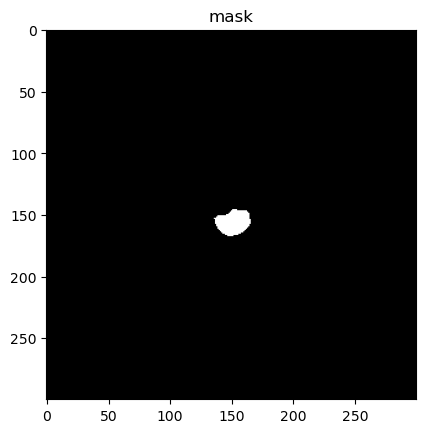

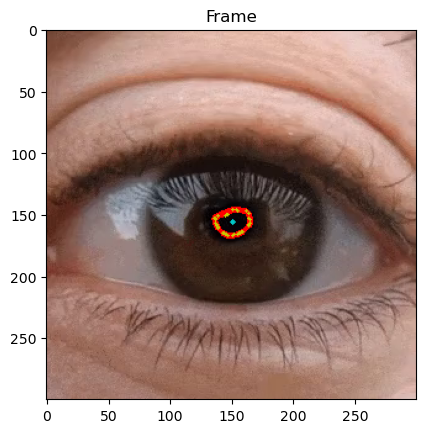

frame=  1
color= [14.46901541 15.57376534 24.14564328]
cx=  151.33333333333334
cy=  157.6


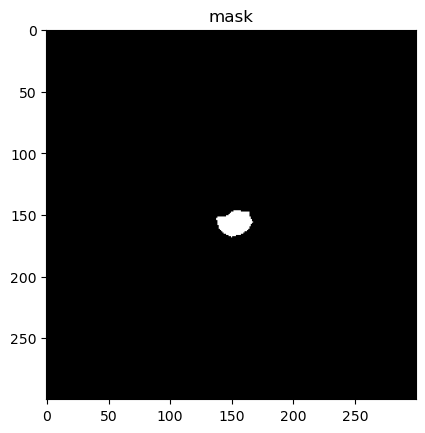

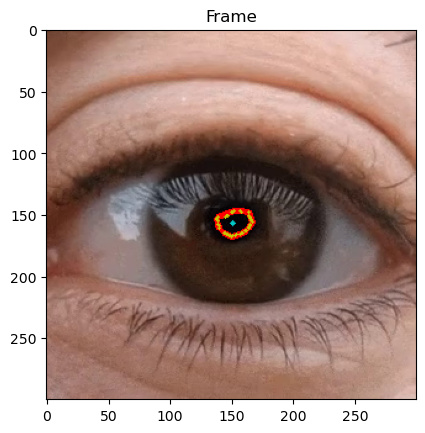

frame=  2
color= [15.05075988 15.93100304 24.43708207]
cx=  157.9375
cy=  157.5


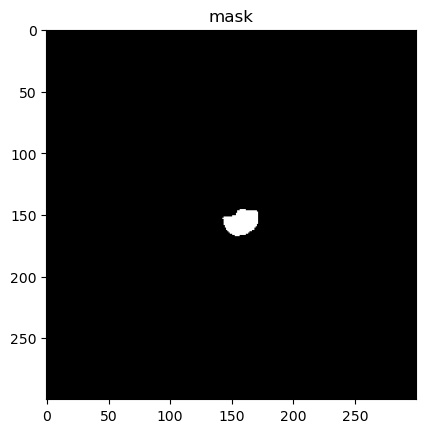

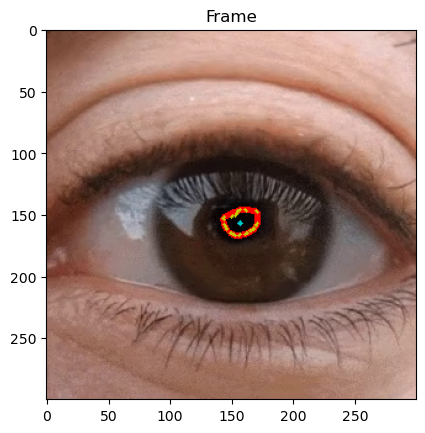

frame=  3
color= [16.1612069  17.22672414 26.0112069 ]
cx=  162.3125
cy=  153.5


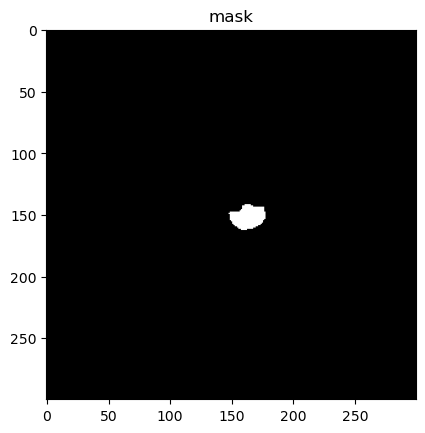

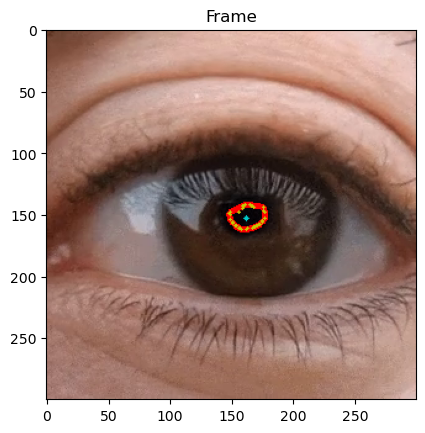

frame=  4
color= [17.90864262 19.73345445 29.16714249]
cx=  169.64285714285714
cy=  143.78571428571428


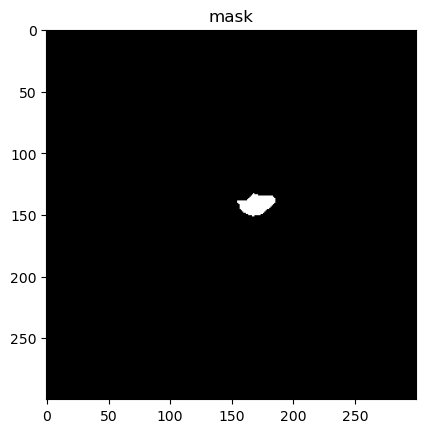

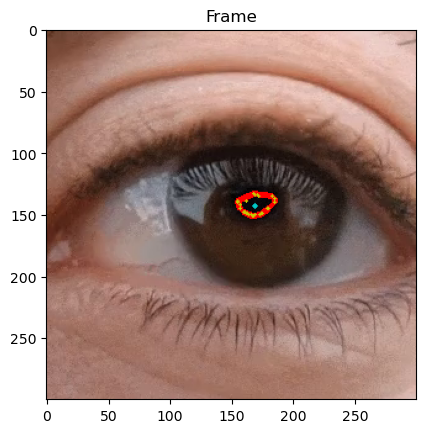

frame=  5
color= [17.84786454 19.61056356 29.2345211 ]
cx=  165.33333333333334
cy=  144.8


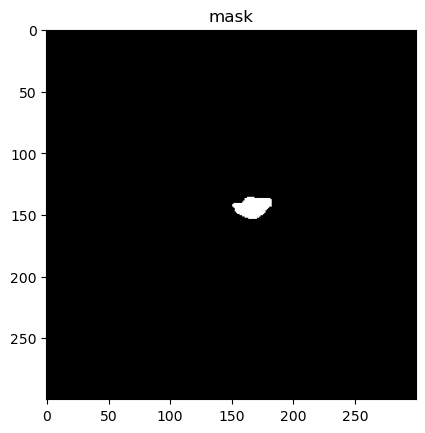

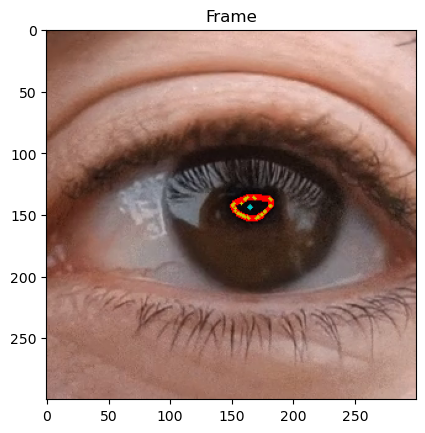

frame=  6
color= [18.74551238 20.89320609 30.85753238]
cx=  163.86666666666667
cy=  144.33333333333334


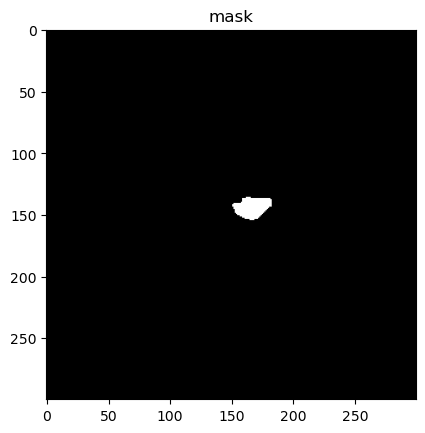

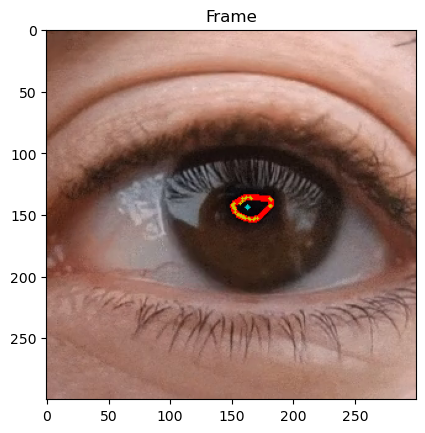

frame=  7
color= [19.13307814 21.82503941 31.42265256]
cx=  174.21428571428572
cy=  139.42857142857142


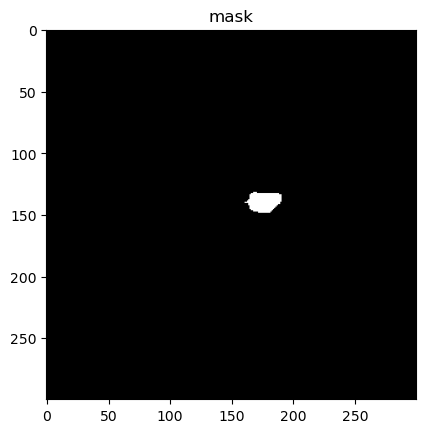

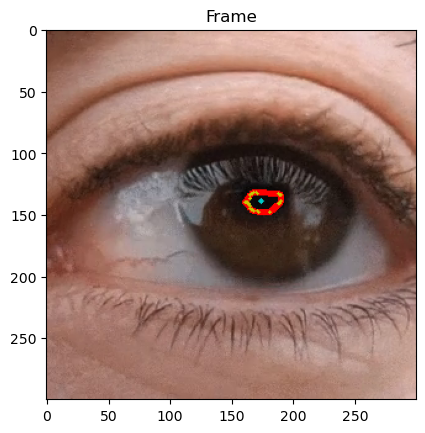

frame=  8
color= [13.53524291 15.22100534 23.81802864]
cx=  147.6875
cy=  160.25


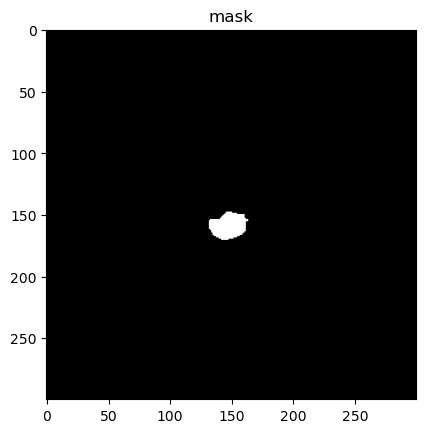

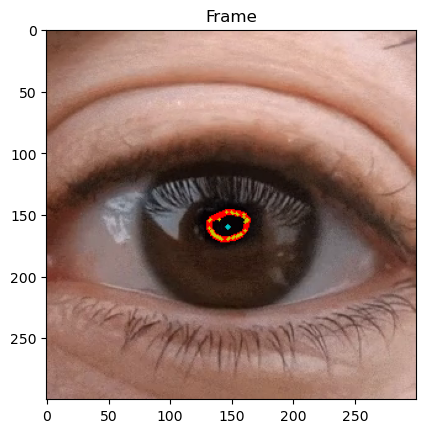

frame=  9
color= [14.08563218 15.58074713 23.73333333]
cx=  150.11111111111111
cy=  158.55555555555554


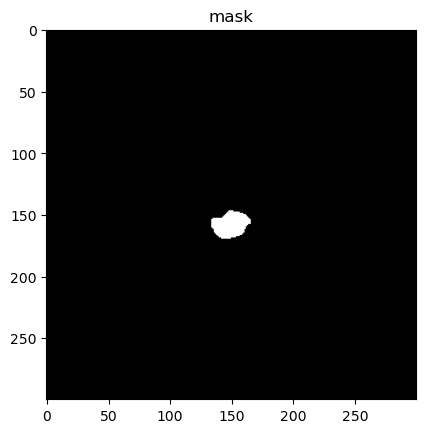

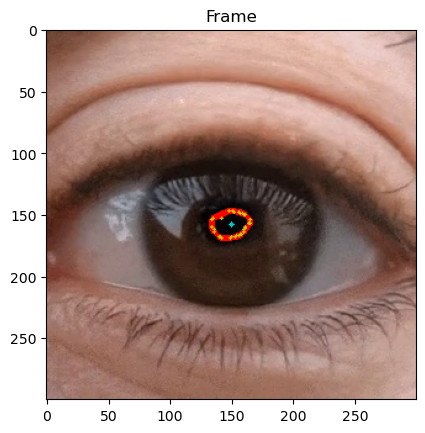

frame=  10
color= [14.58260608 15.53084562 24.05115859]
cx=  159.21052631578948
cy=  161.52631578947367


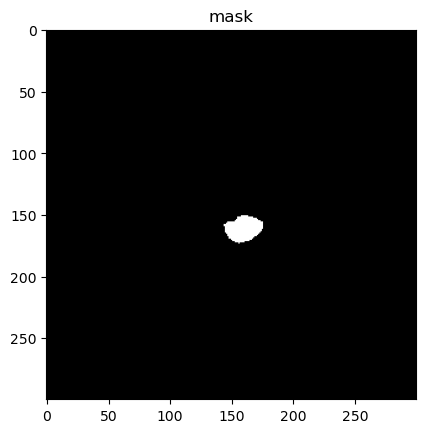

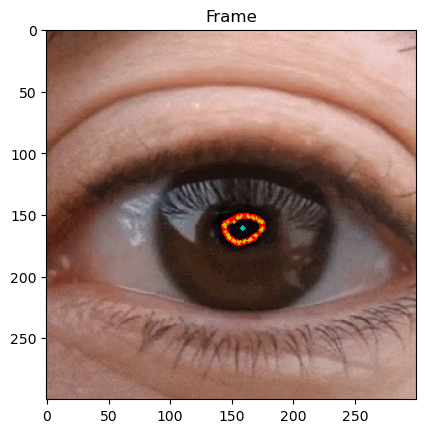

frame=  11
color= [15.29589122 15.98019509 24.25598581]
cx=  162.1764705882353
cy=  164.35294117647058


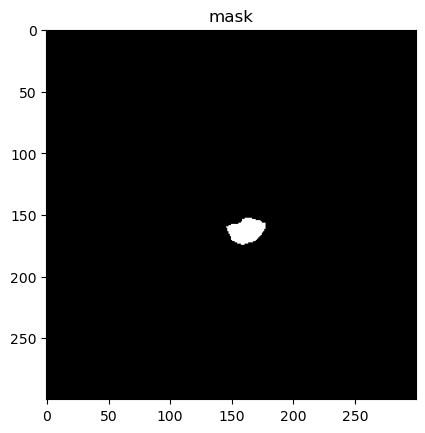

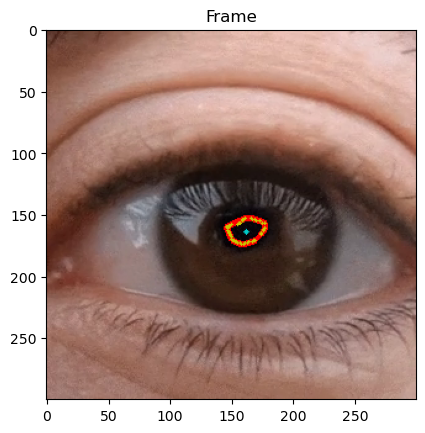

frame=  12
color= [14.99611758 16.57570715 24.60621187]
cx=  171.52941176470588
cy=  160.11764705882354


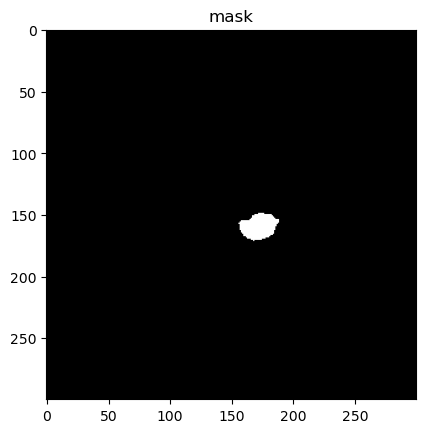

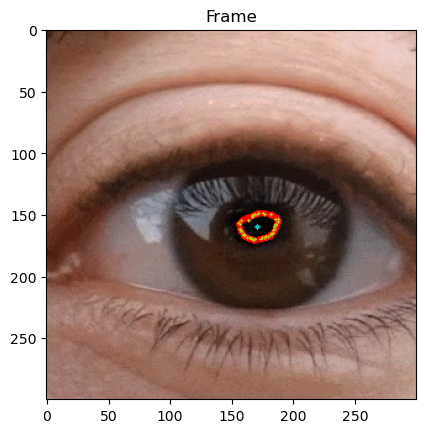

frame=  13
color= [18.08170453 22.0110935  33.51769678]
cx=  121.45454545454545
cy=  133.9090909090909


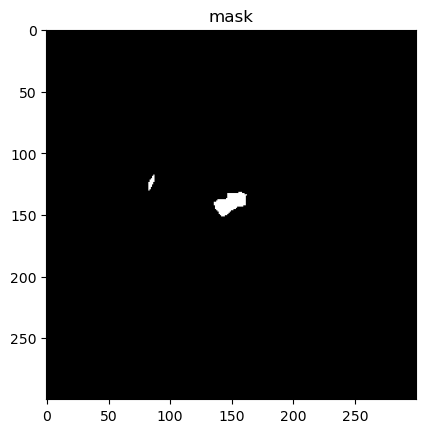

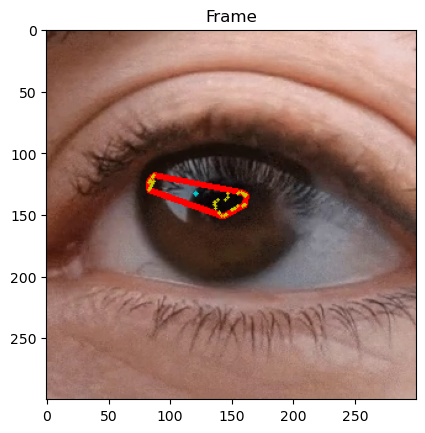

frame=  14
color= [17.20128278 21.04980192 32.23787965]
cx=  131.7
cy=  136.1


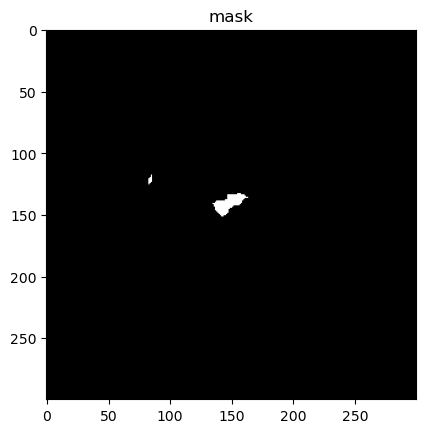

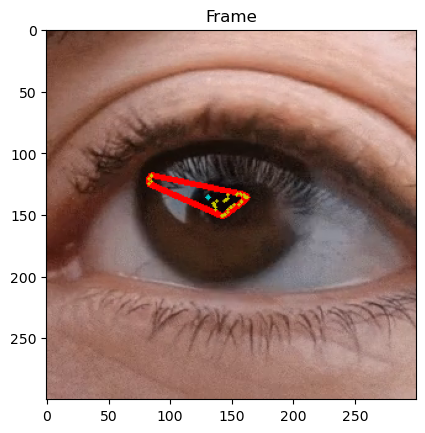

frame=  15
color= [18.10295324 21.84208368 33.35890074]
cx=  110.54545454545455
cy=  128.0909090909091


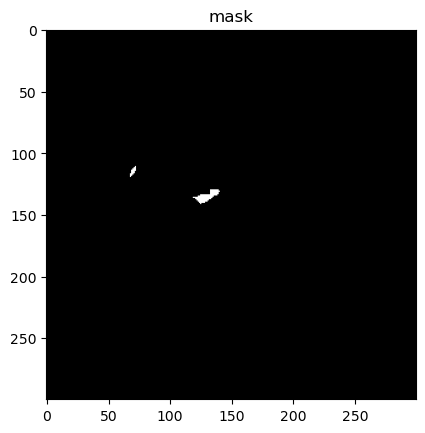

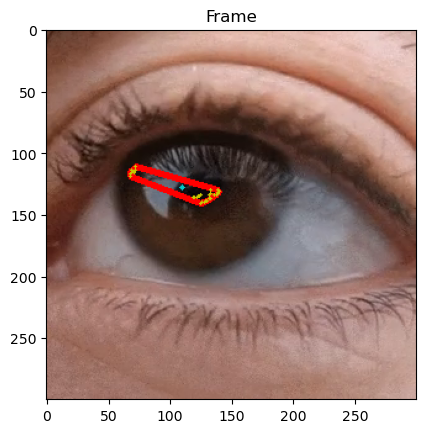

frame=  16
color= [17.91009399 21.76113609 33.42419289]
cx=  104.2
cy=  123.9


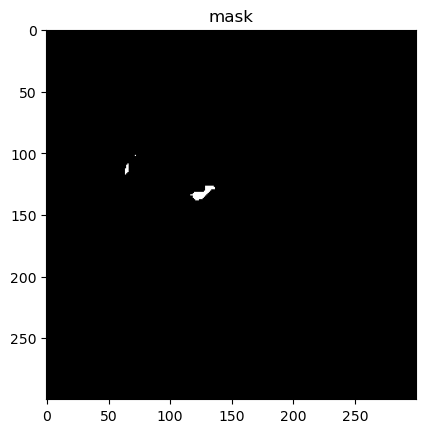

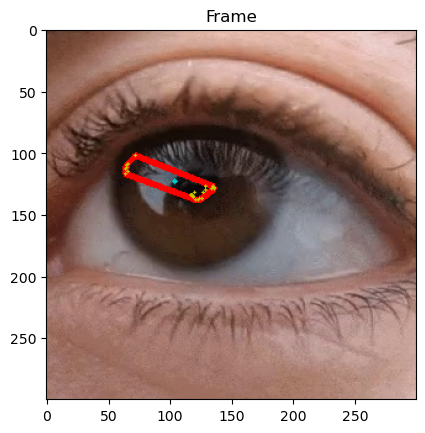

frame=  17
color= [17.03983229 20.65809034 32.25385935]
cx=  116.5
cy=  136.08333333333334


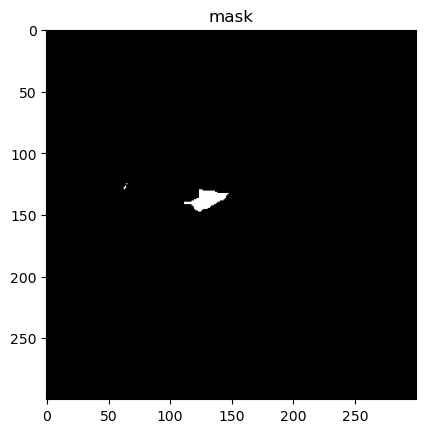

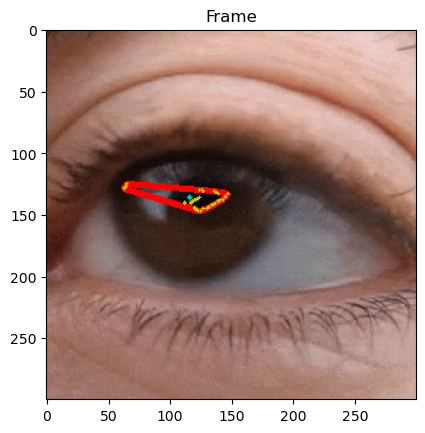

frame=  18
color= [17.72986823 22.45358712 35.1920937 ]
cx=  87.14285714285714
cy=  133.0


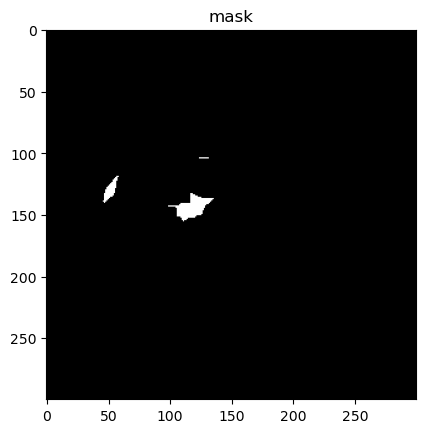

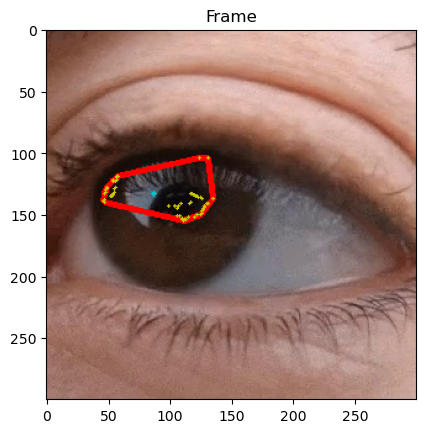

frame=  19
color= [17.23787049 21.03870115 33.02435341]
cx=  130.2
cy=  155.0


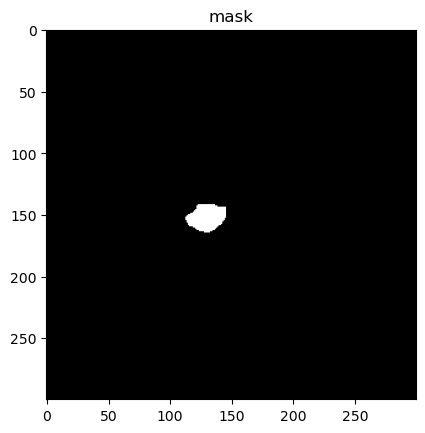

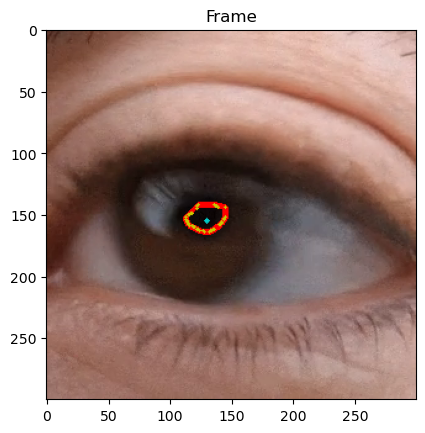

frame=  20
color= [14.76683087 16.51958715 25.13347408]
cx=  153.625
cy=  157.875


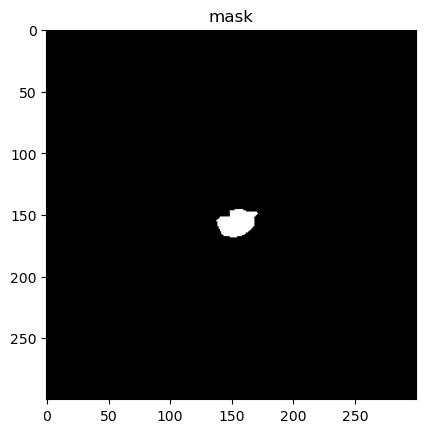

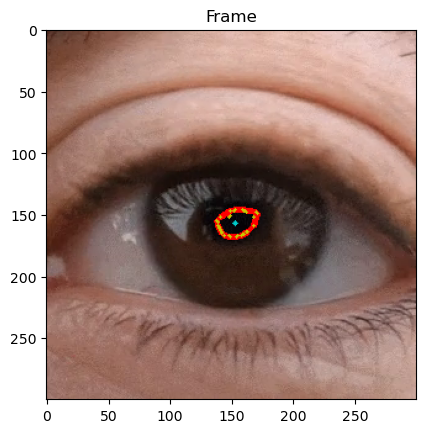

frame=  21
color= [15.84362978 18.27336501 27.58474768]
cx=  171.625
cy=  154.3125


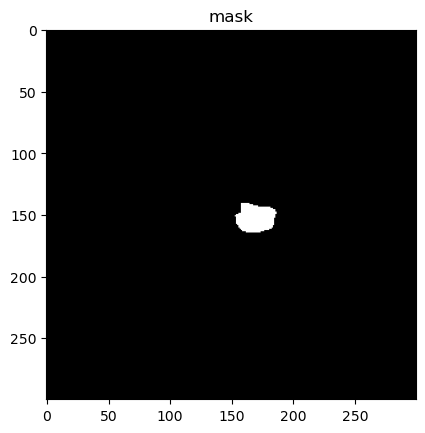

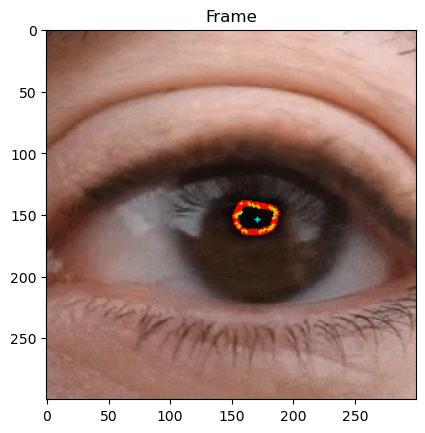

frame=  22
color= [19.1891725  22.43330589 32.86887608]
cx=  187.86666666666667
cy=  148.06666666666666


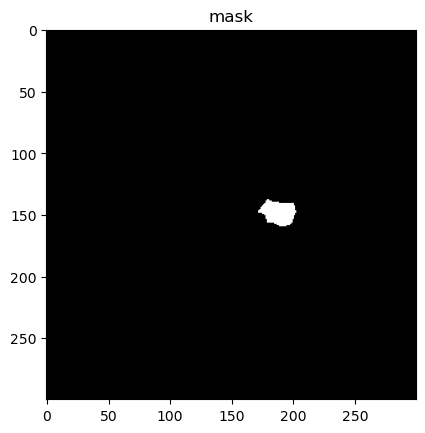

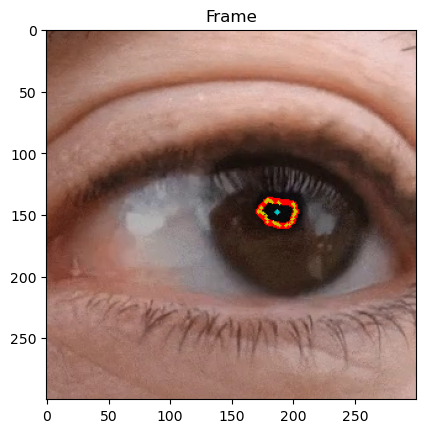

frame=  23
color= [19.39338155 22.72342757 33.5095332 ]
cx=  190.25
cy=  145.83333333333334


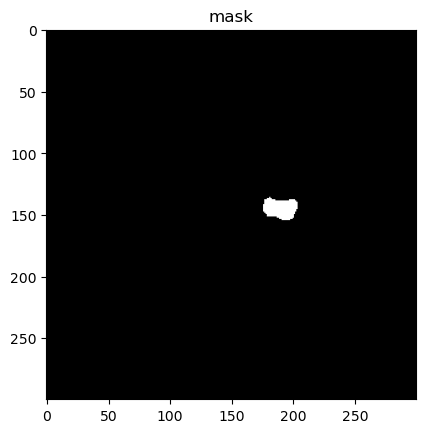

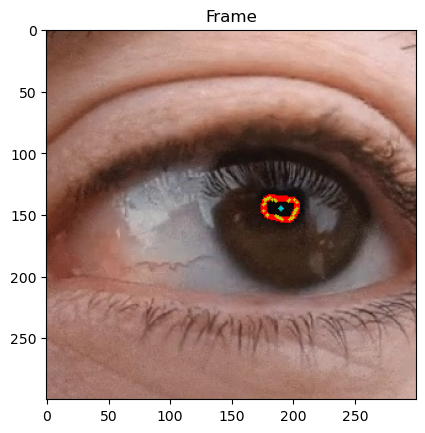

frame=  24
color= [18.14159493 21.60512007 32.32827367]
cx=  198.3846153846154
cy=  161.30769230769232


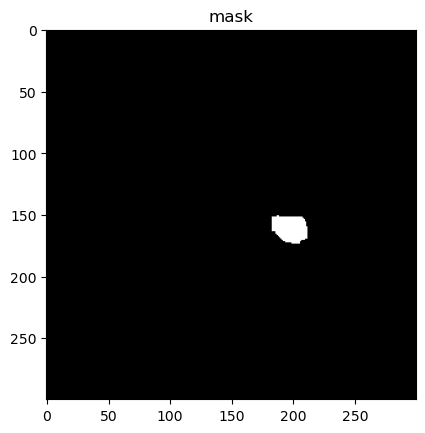

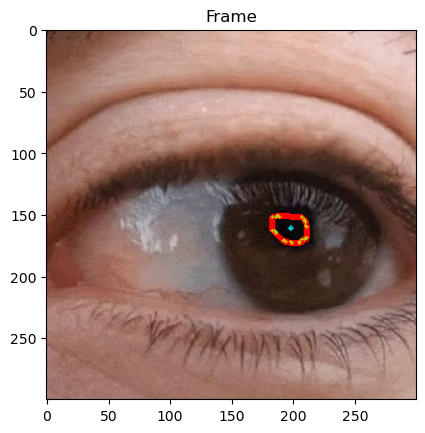

frame=  25
color= [20.77858111 25.89531556 38.85841241]
cx=  193.46666666666667
cy=  164.86666666666667


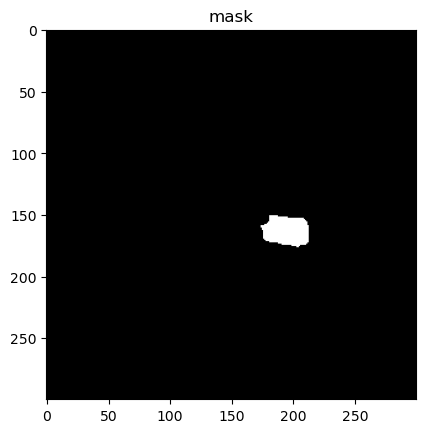

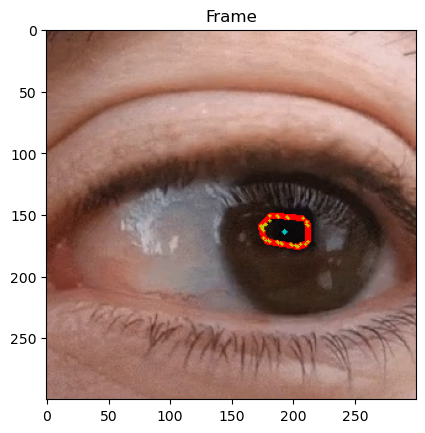

frame=  26
color= [22.16686729 27.15422811 40.50556726]
cx=  197.8181818181818
cy=  167.72727272727272


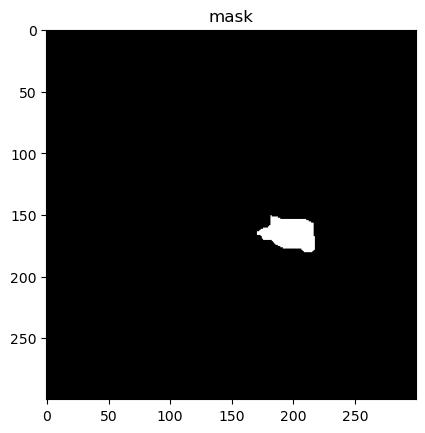

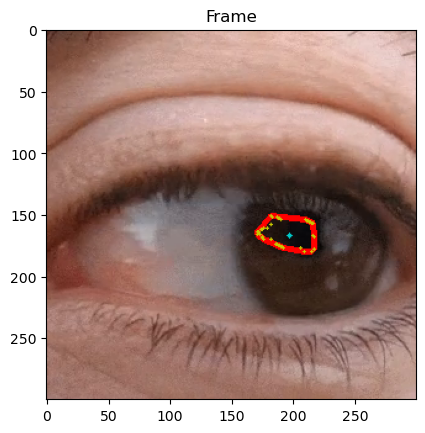

In [3]:
##############  MAIN   ###############################
import os.path


vidEye = cv2.VideoCapture('eye.mp4')


if (vidEye.isOpened() == False):
      print("Error opening the video file")
        
f_count = vidEye.get(7)
f=0
centro=np.zeros(shape=(27,2))


while(f<f_count):
    ret, frame = vidEye.read()
    
    if ret:
        print('frame= ', f)
        f +=1
        mask, frame, c = k_medios(frame, red_seg=False)
        centro[f-1] = c
        
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
        plt.imshow(mask)
        plt.title('mask')
        plt.show()
        
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        plt.imshow(frame)
        plt.title('Frame')
        plt.show()
        #cv2.imshow("Image", frame)
        #cv2.imshow("th", mask)

        #cv2.imwrite('mask_' + str(f) + '.jpg', mask)
        #cv2.imwrite('frame_' + str(f) + '.jpg', frame)
    else:
        f=0
        print('no video')
        vidEye.set(cv2.CAP_PROP_POS_FRAMES, 0)
    key = cv2.waitKey(30)
    if key == 27:
        break



Gráfico - Desplazamiento del centro

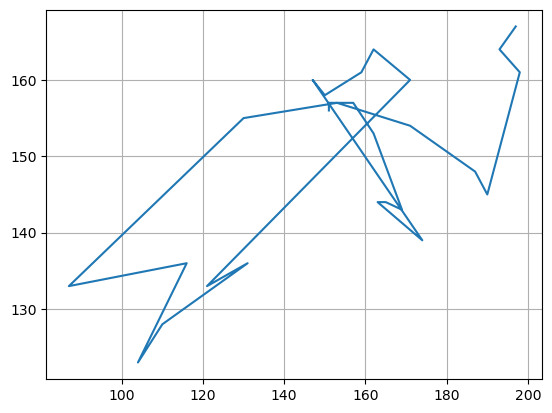

In [4]:
x=centro[:,0]
y=centro[:,1]
plt.plot(x,y)
plt.grid('on')
plt.show()

vidEye.release()
cv2.destroyAllWindows()

### Procesamiento del video del Auto

Con *bounding box* y cierre convexo

frame=  0
color= [ 38.01775978  38.15033494 225.70088799]
cx=  267.0
cy=  128.11111111111111


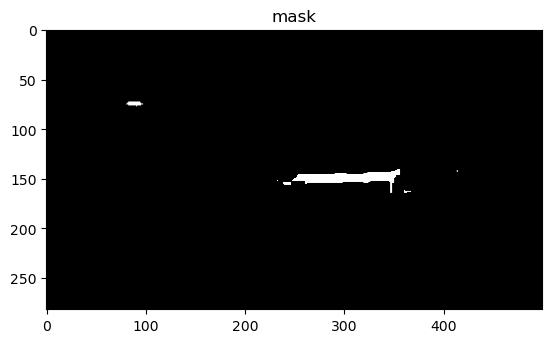

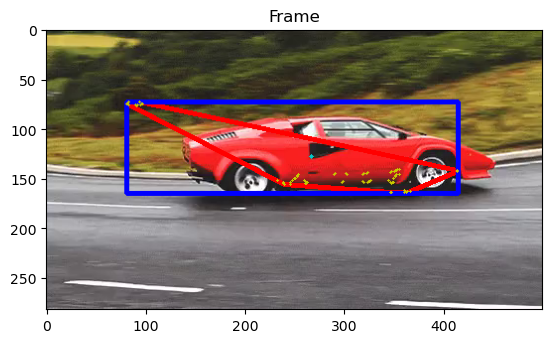

frame=  1
color= [ 39.40036014  39.20018007 227.20918367]
cx=  222.36363636363637
cy=  135.8181818181818


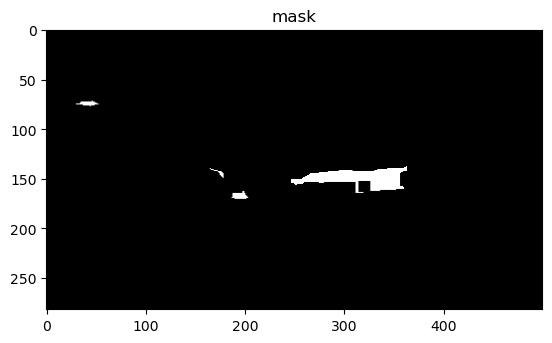

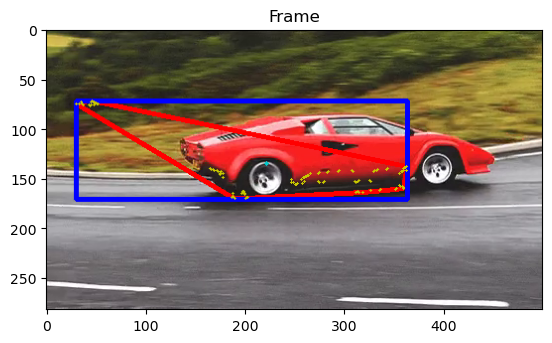

frame=  2
color= [ 38.60838415  38.43018293 229.42362805]
cx=  228.9
cy=  142.8


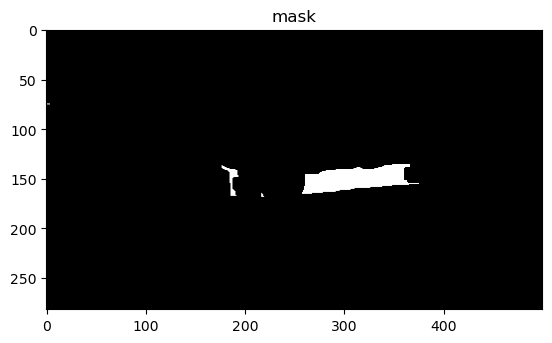

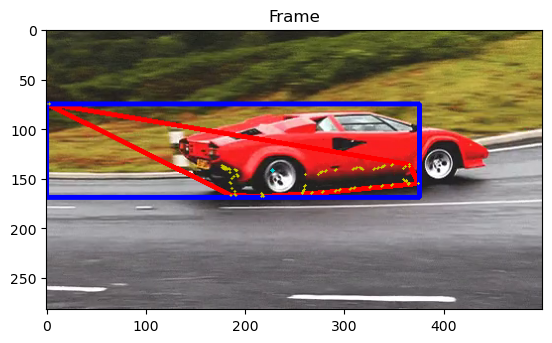

frame=  3
color= [ 38.83047002  38.44230146 228.61734198]
cx=  270.15384615384613
cy=  150.23076923076923


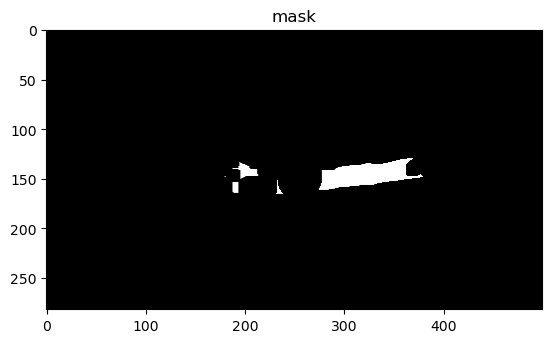

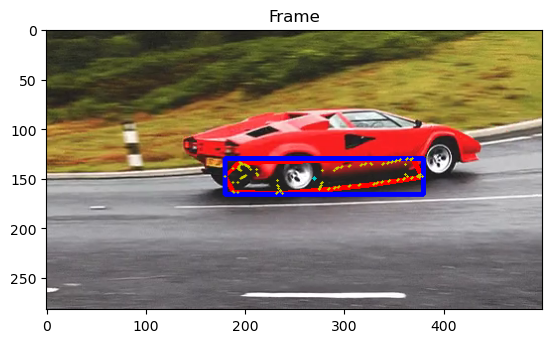

frame=  4
color= [ 50.15379282  49.74303148 232.67785328]
cx=  237.35714285714286
cy=  119.07142857142857


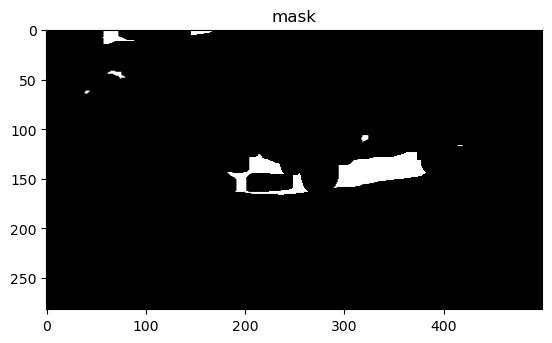

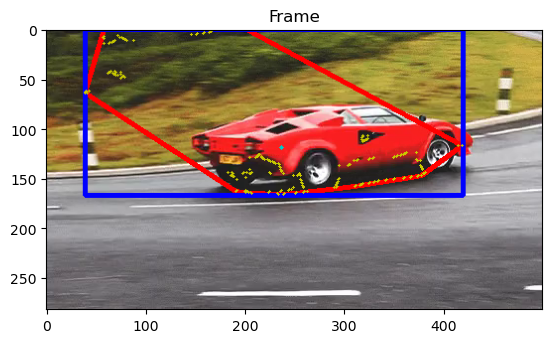

frame=  5
color= [ 51.16025024  50.44497915 231.82114212]
cx=  248.4
cy=  124.4


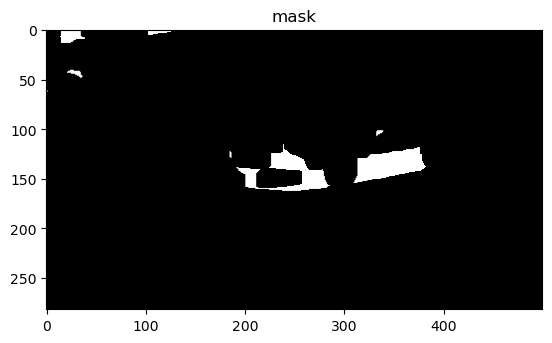

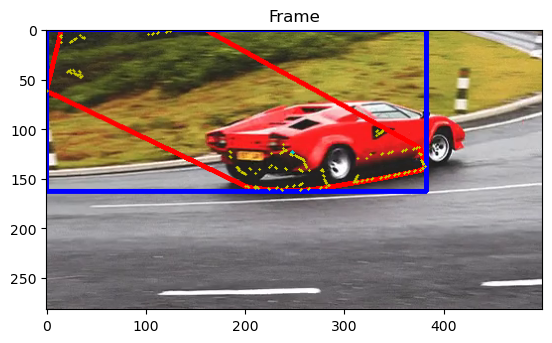

frame=  6
color= [ 51.56782759  50.93149894 230.58033481]
cx=  264.0625
cy=  114.8125


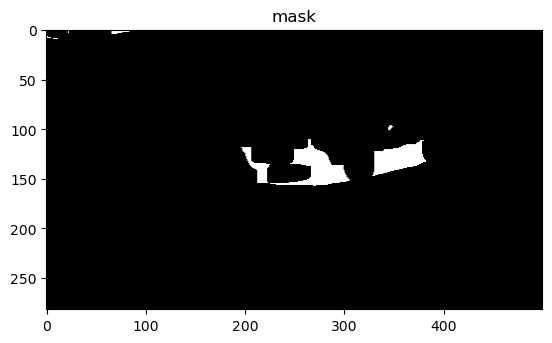

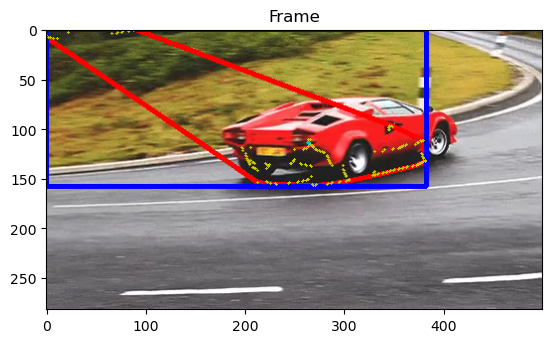

frame=  7
color= [ 49.68419794  49.53980397 229.05211571]
cx=  257.125
cy=  101.9375


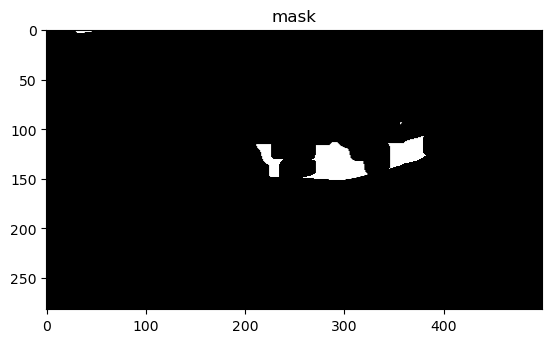

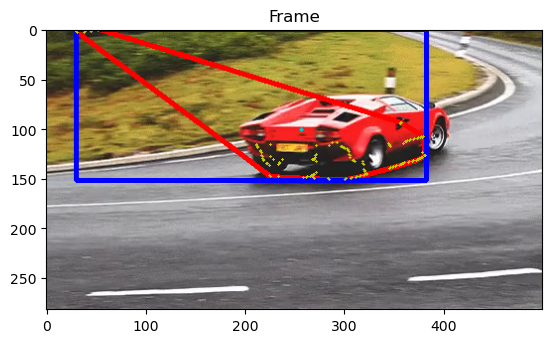

frame=  8
color= [ 50.49058296  50.06606876 225.85231689]
cx=  255.69230769230768
cy=  103.61538461538461


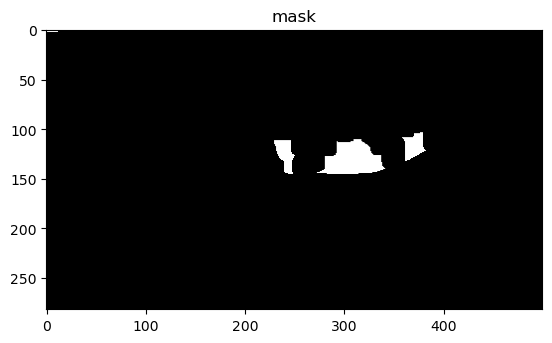

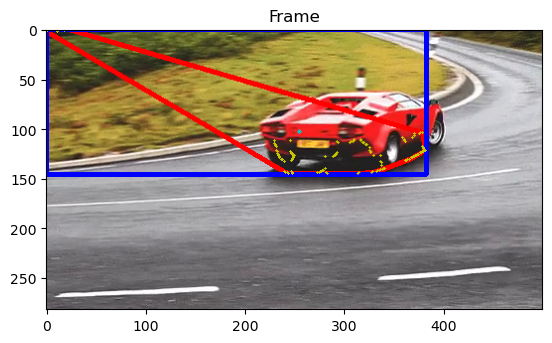

frame=  9
color= [ 55.28055754  54.69835597 221.26197284]
cx=  323.1666666666667
cy=  112.66666666666667


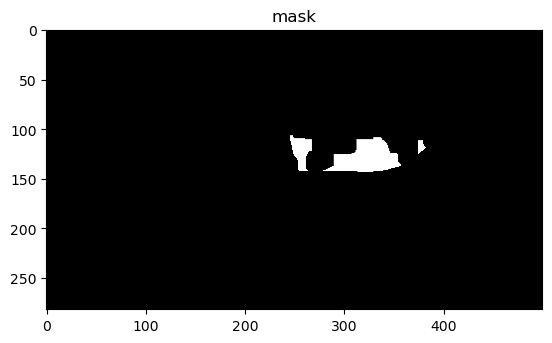

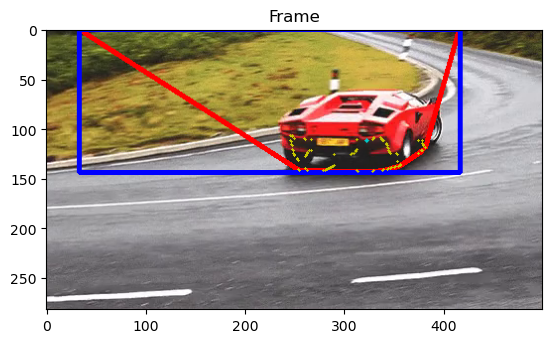

frame=  10
color= [ 58.03340471  56.85267666 214.77815846]
cx=  287.92857142857144
cy=  96.14285714285714


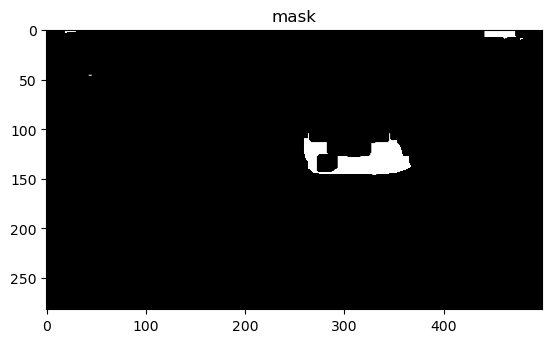

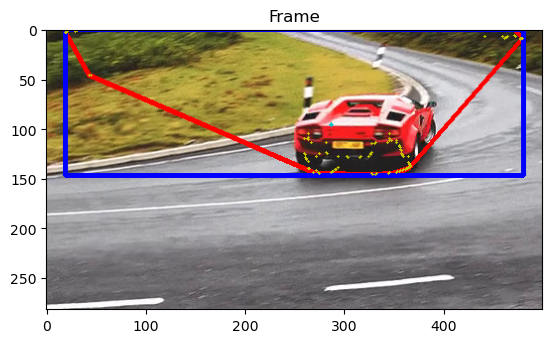

frame=  11
color= [ 56.0963512   55.00057013 213.98061574]
cx=  285.53846153846155
cy=  94.15384615384616


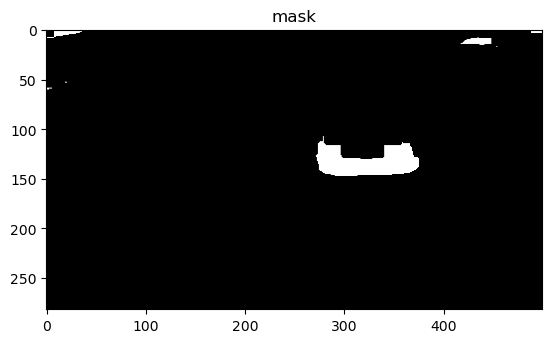

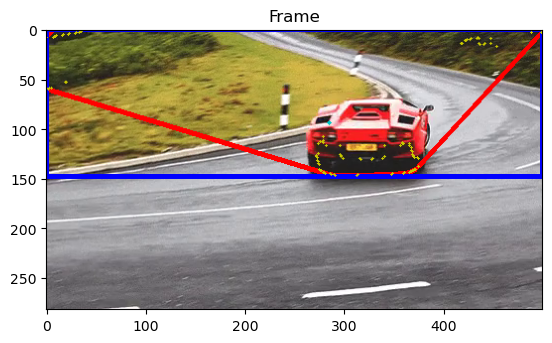

frame=  12
color= [ 55.76996805  54.01277955 210.97188498]
cx=  305.0
cy=  99.27272727272727


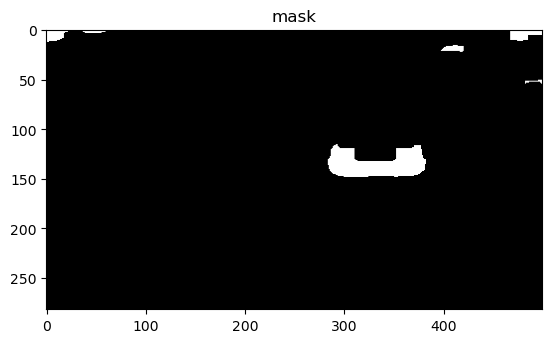

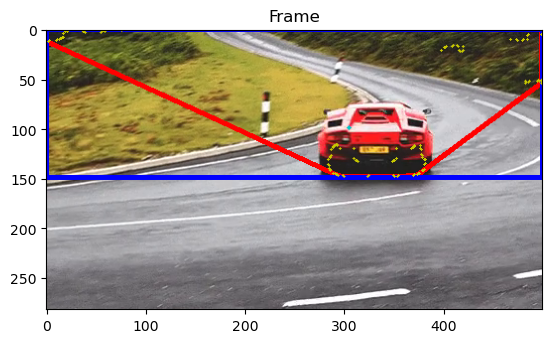

frame=  13
color= [ 53.81281497  53.03599712 208.49892009]
cx=  335.8
cy=  83.8


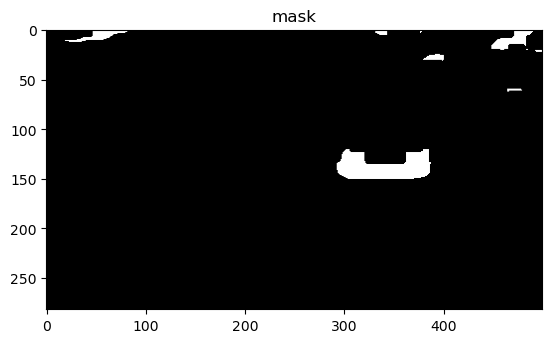

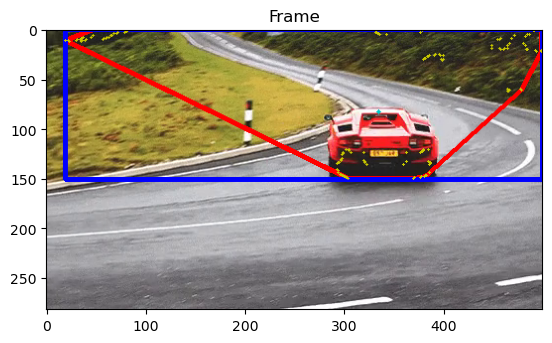

frame=  14
color= [ 58.99079972  58.83581033 210.12384996]
cx=  329.2
cy=  90.6


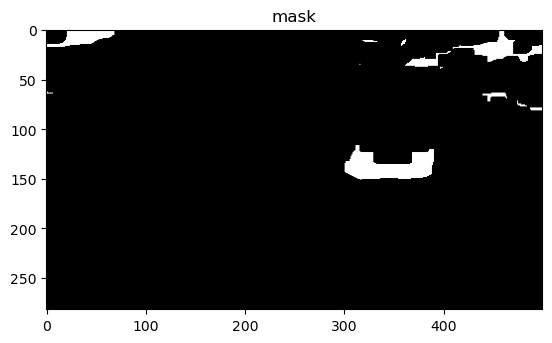

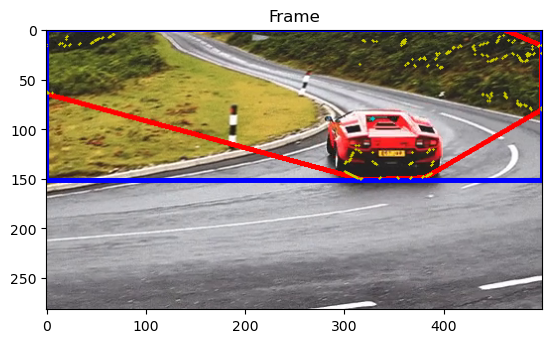

frame=  15
color= [ 56.57015743  57.67282683 204.9596167 ]
cx=  317.75
cy=  86.16666666666667


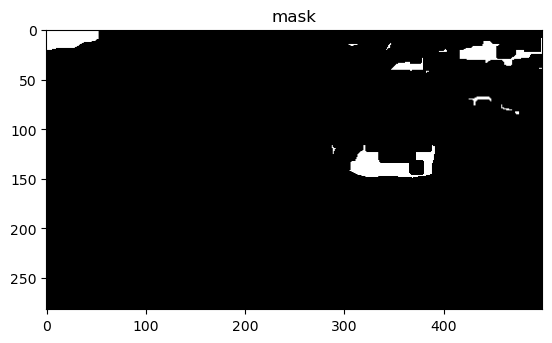

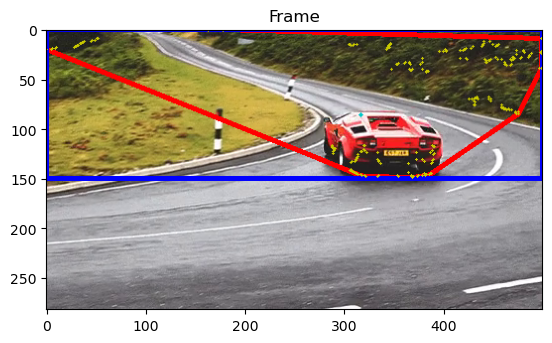

frame=  16
color= [ 60.20658489  59.88508715 207.11943189]
cx=  325.0
cy=  92.81818181818181


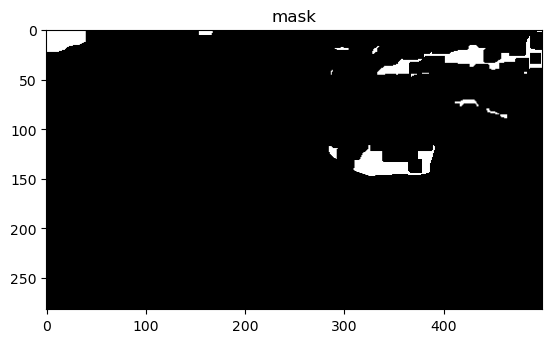

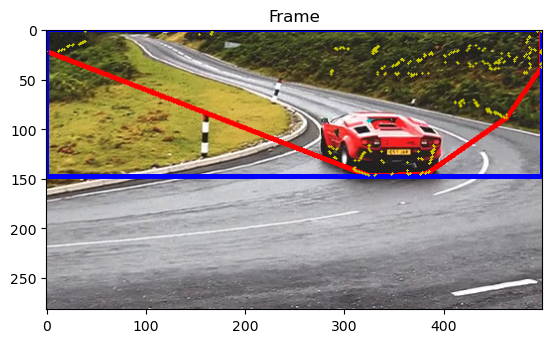

frame=  17
color= [ 59.76868557  60.18621134 209.04510309]
cx=  321.38461538461536
cy=  79.84615384615384


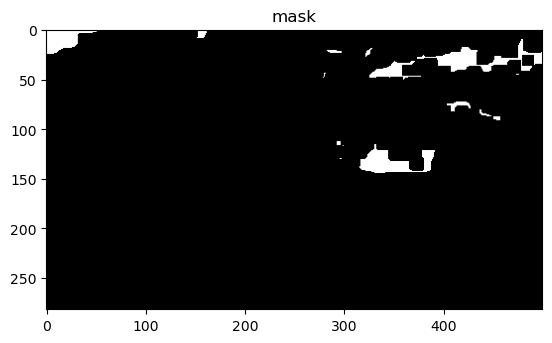

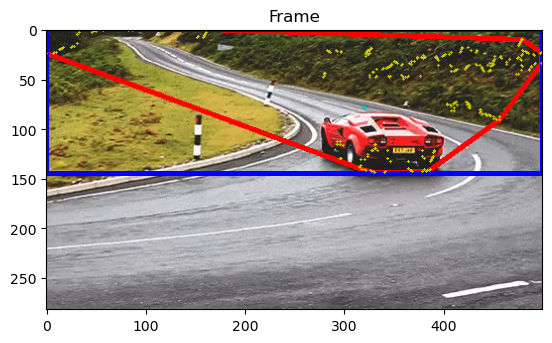

frame=  18
color= [ 63.17710997  62.23017903 209.85741688]
cx=  305.5
cy=  80.25


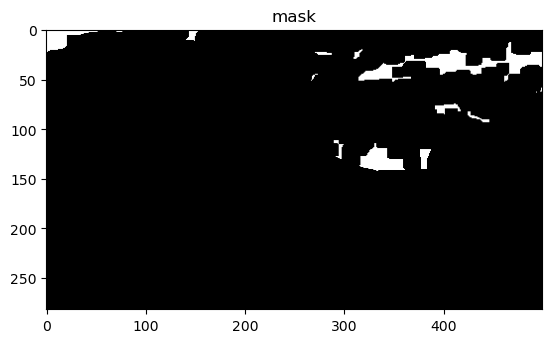

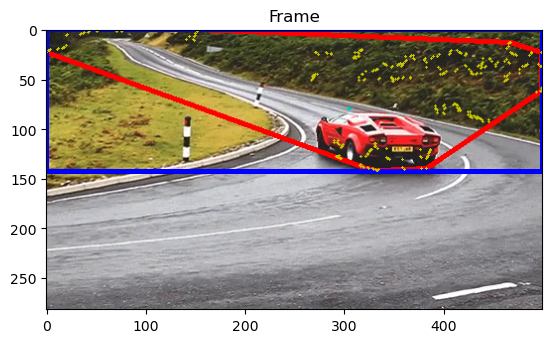

frame=  19
color= [ 61.66144414  60.95367847 214.51634877]
cx=  317.7692307692308
cy=  73.3076923076923


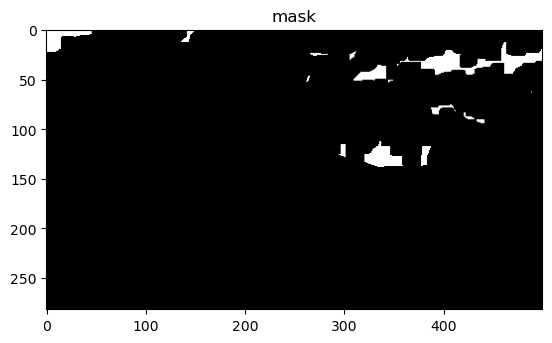

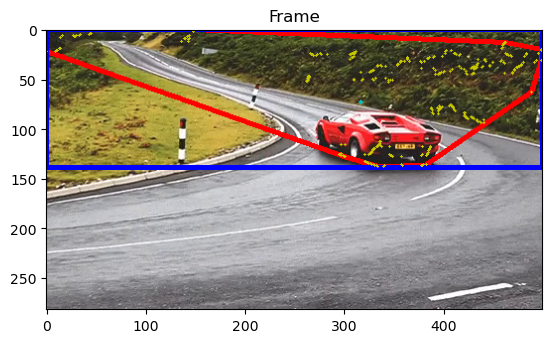

frame=  20
color= [ 62.50747283  61.54279891 215.26766304]
cx=  325.85714285714283
cy=  72.42857142857143


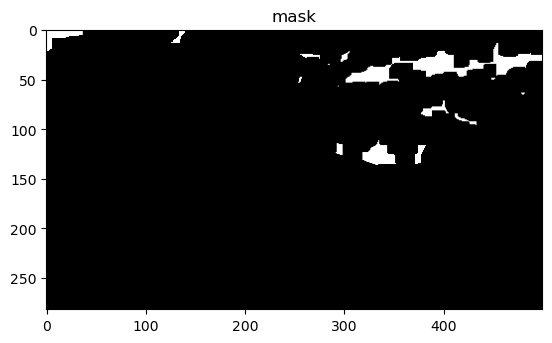

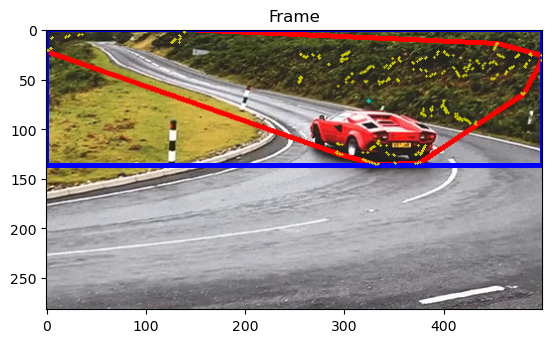

frame=  21
color= [ 61.73016949  60.51118644 215.90915254]
cx=  317.6923076923077
cy=  70.23076923076923


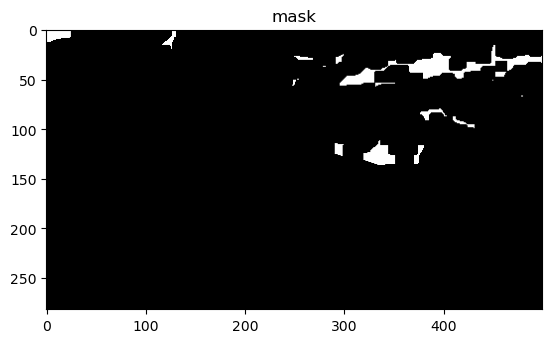

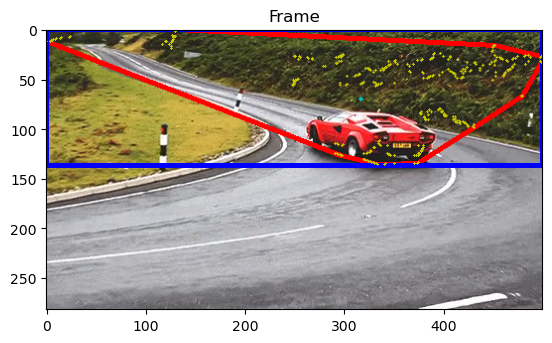

frame=  22
color= [ 60.57069409  59.94730077 216.13624679]
cx=  312.0833333333333
cy=  69.33333333333333


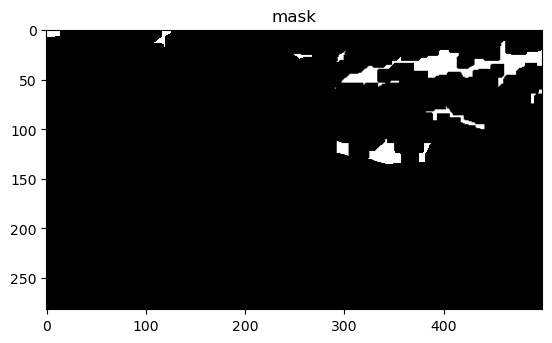

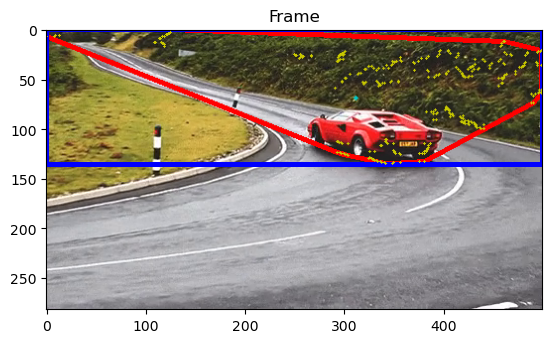

frame=  23
color= [ 62.90523256  60.55755814 216.56162791]
cx=  329.2
cy=  71.8


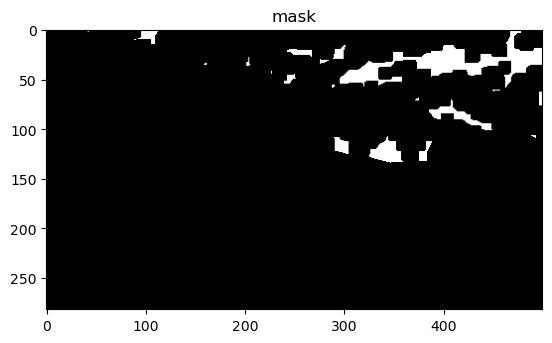

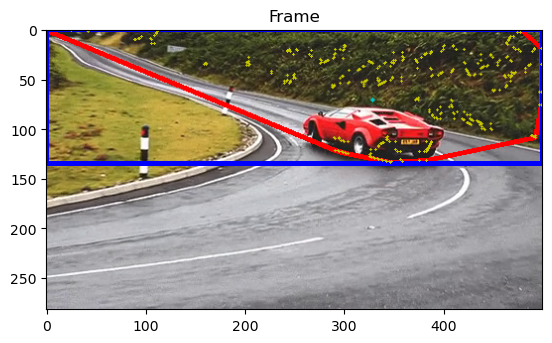

frame=  24
color= [ 63.18201998  60.35849057 217.60044395]
cx=  331.45454545454544
cy=  81.45454545454545


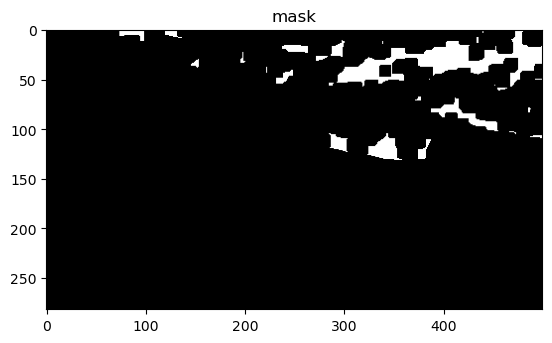

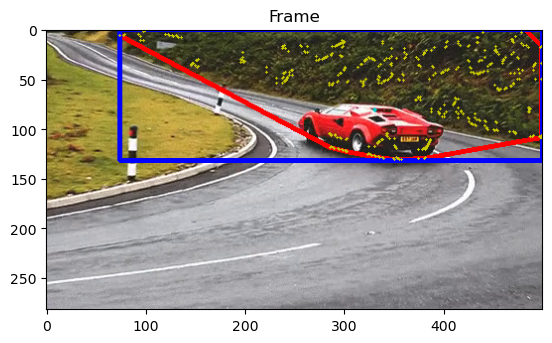

In [5]:
##############  MAIN   ###############################
vidCar = cv2.VideoCapture('Red_car.mp4')

if (vidCar.isOpened() == False):
      print("Error opening the video file")
f_count = vidCar.get(7)
f=0

while(f<f_count):
    ret, frame = vidCar.read()

    if ret:
        print('frame= ', f)
        f +=1
        mask, frame, c = k_medios(frame, red_seg=True)
        
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
        plt.imshow(mask)
        plt.title('mask')
        plt.show()
        
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        plt.imshow(frame)
        plt.title('Frame')
        plt.show()

    else:
        f=0
        print('no video')
        vidCar.set(cv2.CAP_PROP_POS_FRAMES, 0)
    key = cv2.waitKey(30)
    if key == 27:
        break

vidCar.release()
cv2.destroyAllWindows()